## Quick analysis of ELG truth table, and the failure modes

In [1]:
import os, sys, glob
import numpy as np

from astropy.io import fits
from astropy.table import Table, join, vstack
from astropy.io import fits

import pandas as pd
import fnmatch

import desispec.io

#import desispec
# library location will change ..
sys.path.append("/global/homes/r/rtojeiro/prospect/prospect/py")
from prospect import utils_specviewer,plotframes
import matplotlib.pyplot as plt 
fs = 15

In [2]:
tiledir   = '/global/cfs/cdirs/desi/spectro/redux/daily/tiles/'
tiles = ['67230']
nights = ['20200315']
petals = ['0','1', '2', '3', '4', '5', '6' ,'7', '8', '9']
obs_db = utils_specviewer.make_targetdict(tiledir, petals=petals, tiles=tiles) # tiles = optional 
del obs_db['67230-20200314']
obs_db.keys()

dict_keys(['67230-20200315'])

In [3]:
pd.set_option('display.max_rows', 10)

In [4]:
def display_spectra(targetIDs, show_spectra=None):

    # VI interface in notebook
    if show_spectra:
        spectra, zcat= utils_specviewer.load_spectra_zcat_from_targets(targetIDs, tiledir, obs_db)
        plotframes.plotspectra(spectra, zcatalog=zcat, title='Target_select', notebook=True, mask_type='CMX_TARGET',with_vi_widgets=False)

### Read table

Set $TT_DIR 

In [5]:
full_filename = 'truth_table_ELG_v1.1.csv'
tt = pd.read_csv(os.environ['TT_DIR']+'/'+full_filename)
tt['dz'] = (tt['Redrock z'] - tt['best z'])/(1 + tt['best z'])

In [6]:
tt.keys()

Index(['Unnamed: 0', 'TARGETID', 'Redrock z', 'Redrock spectype', 'best z',
       'best spectype', 'best flag', 'N_VI', 'all VI issue', 'all VI comments',
       'merger comment', 'DELTACHI2', 'ZWARN', 'ZERR', 'FIBER', 'FLUX_G',
       'FLUX_R', 'FLUX_Z', 'FIBERFLUX_G', 'FIBERFLUX_R', 'FIBERFLUX_Z',
       'MW_TRANSMISSION_G', 'MW_TRANSMISSION_R', 'MW_TRANSMISSION_Z', 'dz'],
      dtype='object')

In [7]:
len(tt)

950

## Histogram of combined flags
A combined flag is the mean of the flags of all inspectors in the cases where there are no conflicts, or a flag manually set by a merger in case of conflicts.

**We take all objects with a combined flag greater than 2.5 as secure.**

Text(0,0.5,'N')

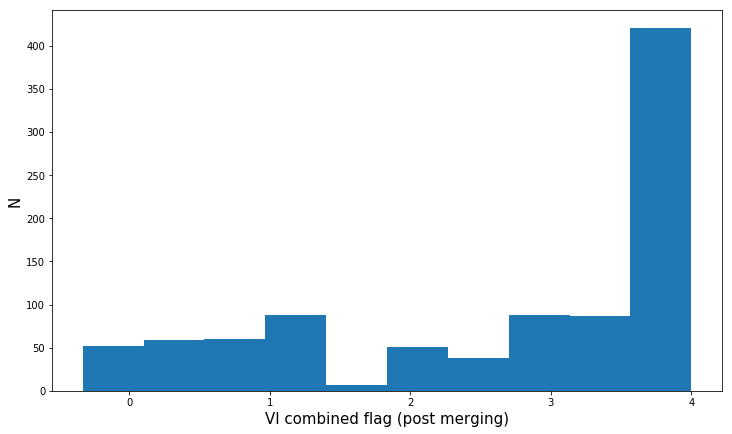

In [8]:
plt.figure(figsize=(12,7))
plt.hist(tt['best flag'])
plt.xlabel('VI combined flag (post merging)', fontsize=fs)
plt.ylabel('N', fontsize=fs)

## Redshift distribution and numbers

In [9]:
good_z = tt[(tt['best flag'] >=2.5)]
elgs = tt[(tt['best z'] > 0.6) & (tt['best z'] < 1.6) & (tt['best spectype'] == 'GALAXY')]
good_elgs = tt[(tt['best flag'] >=2.5) & (tt['best z'] > 0.6) & (tt['best z'] < 1.6) & (tt['best spectype'] == 'GALAXY')]
print(len(elgs))
print(len(good_elgs))
print(len(good_z))

759
571
619


In [10]:
print('fraction of secure ELG redshifts: ',len(good_elgs)/len(elgs))
print('fraction of secure redshifts: ',len(good_z)/len(tt))

fraction of secure ELG redshifts:  0.7523056653491436
fraction of secure redshifts:  0.651578947368421


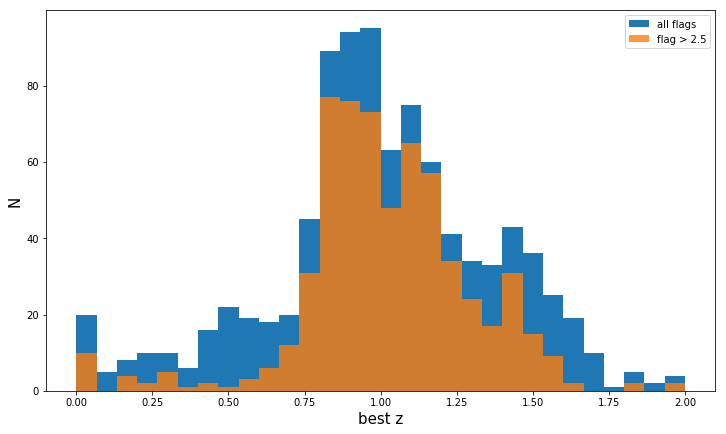

In [11]:
plt.figure(figsize=(12,7))
plt.hist(tt['best z'], label='all flags', range=(0,2), bins=30)
plt.hist(good_z['best z'], label = 'flag > 2.5', range=(0,2), bins=30, alpha=0.8)
plt.xlabel('best z', fontsize=fs)
plt.ylabel('N', fontsize=fs)
plt.legend()

## Looking at the failures in more detail

We define **secure failures** as objects for which redrock got the wrong redshift, but VI provides a secure redshift.

We define **not secure failures** as objects for which redrock (probably) got the wrong redshift, and for which inspectors attempted an alternative redshift, but with low confidence.

We can then inspect each of these sets in a dedicated prospect window.

(below, we will also look at all spectra with poor VI flags)

Text(0.5,1,'Secure redshifts after VI')

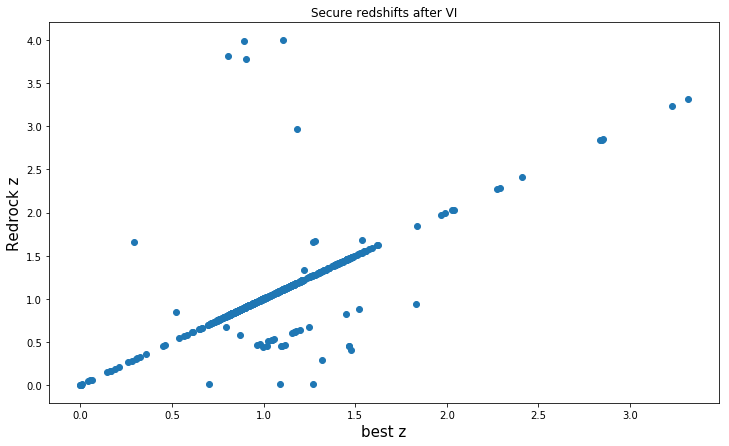

In [12]:
plt.figure(figsize=(12,7))
plt.scatter(good_z['best z'],good_z['Redrock z'] )
plt.xlabel('best z', fontsize=fs)
plt.ylabel('Redrock z', fontsize=fs)
plt.title('Secure redshifts after VI')

In [13]:
fail_secure = tt[(np.abs(tt['dz'])>0.0033) & (tt['best flag']>=2.5)]
print(len(fail_secure))

40


In [14]:
fail_not_secure = tt[(np.abs(tt['dz'])>0.0033) & (tt['best flag']<2.5)]
print(len(fail_not_secure))

40


In [15]:
#display_spectra(fail_not_secure['TargetID'].to_list(), show_spectra=True)

## Looking at spectra with low VI flags

More generally, we can look at ALL spectra with poor quality flags (for many of these, the redrock z will have been left untouched, and do not qualify as "failures")

In [16]:
not_secure = tt[tt['best flag']<2.5]
print(len(not_secure))

331


## Looking at all spectra for which at least one inspector ticked the "bad spectrum" box

Please note that this isn't very reliable - firtsly, we know that this isn't a complete list (many inspectors would forget to set tick this box) and, secondly, some inspectors would tick this box for noisy spectra (a minority). But it should still catch a lot of interesting stuff.

Reading the "all VI comments" field should yield some clue as to why certain spectra were flagged as bad.

In [17]:
bad_spec = tt[tt['all VI issue'].str.contains('S') ]

In [18]:
bad_spec

,Unnamed: 0,TARGETID,Redrock z,Redrock spectype,best z,best spectype,best flag,N_VI,all VI issue,all VI comments,...,FLUX_G,FLUX_R,FLUX_Z,FIBERFLUX_G,FIBERFLUX_R,FIBERFLUX_Z,MW_TRANSMISSION_G,MW_TRANSMISSION_R,MW_TRANSMISSION_Z,dz
2,2,35185754028116626,1.2095,GALAXY,1.2095,GALAXY,2.000000,3,S|S|S,Missing data and noise in middle. [O II] may b...,...,0.398110,0.364910,1.306789,0.180468,0.165418,0.592383,0.911692,0.939622,0.965764,0.00000
6,6,35185754028117638,1.1293,GALAXY,1.1293,GALAXY,3.666667,3,S|--|--,continuum jump in blue - fit ok|--|--,...,0.500127,0.660811,1.471567,0.276417,0.365226,0.813327,0.912037,0.939861,0.965902,0.00000
15,15,35185754032308609,0.3384,GALAXY,0.3384,GALAXY,0.333333,3,--|--|RS,no features|--| fit not convincing (doublet a...,...,0.375987,0.414297,0.967130,0.210509,0.231959,0.541481,0.916971,0.943284,0.967868,0.00000
23,23,35185754032309517,1.0339,GALAXY,1.0339,GALAXY,3.666667,3,--|--|S,Balmer lines Hdelta Hgamma on sky lines?|--| ...,...,0.340937,0.396403,1.312704,0.140459,0.163309,0.540805,0.919272,0.944877,0.968782,0.00000
24,24,35185754032309690,1.2128,GALAXY,1.2128,GALAXY,3.666667,3,--|--|S,--|--|--,...,0.315450,0.298659,0.394755,0.244831,0.231799,0.306382,0.920050,0.945416,0.969091,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
926,926,35185741965298041,0.1029,GALAXY,2.3823,QSO,2.000000,3,S|R|--,--|dubious fit (one strong broad feature at 41...,...,NaN,NaN,NaN,NaN,NaN,NaN,0.893252,0.926777,0.958357,-0.67392
934,934,35185741965298917,1.5418,GALAXY,1.5418,GALAXY,0.000000,3,--|RS|--,--| dubious fit (negative doublet in noisy reg...,...,NaN,NaN,NaN,NaN,NaN,NaN,0.896848,0.929288,0.959809,0.00000
936,936,35185741965299283,1.2137,GALAXY,1.2137,GALAXY,3.333333,3,S|--|--,Perfect 5700-6700AA process fail|--|--,...,NaN,NaN,NaN,NaN,NaN,NaN,0.899304,0.931002,0.960799,0.00000
943,943,35185741965300232,5.2151,QSO,5.2151,QSO,0.000000,3,--|RCS|--,RR fitted z higher than Prospect can go|doesn...,...,NaN,NaN,NaN,NaN,NaN,NaN,0.902650,0.933334,0.962144,0.00000


In [19]:
##N.B: notebooks get unmanageable if we load prospect with more than ~50 spectra in a single window, 
# so change the indices below to load more spectra (in a new cell if preferred)
display_spectra(bad_spec.iloc[0:50]['TARGETID'].to_list(), show_spectra=True)

Loading BokehJS ...

In [20]:
#To see the next 50:
#display_spectra(bad_spec.iloc[50:100]['TARGETID'].to_list(), show_spectra=True)

## Looking at spectra with certain keywords in the merger comment field

In [21]:
broad_OII = tt[tt['merger comment'].str.contains('broadened but unresolved line') ]

In [22]:
broad_OII

,Unnamed: 0,TARGETID,Redrock z,Redrock spectype,best z,best spectype,best flag,N_VI,all VI issue,all VI comments,...,FLUX_G,FLUX_R,FLUX_Z,FIBERFLUX_G,FIBERFLUX_R,FIBERFLUX_Z,MW_TRANSMISSION_G,MW_TRANSMISSION_R,MW_TRANSMISSION_Z,dz
800,800,35185735929695223,1.0936,GALAXY,1.0936,GALAXY,2.333333,3,RCS|--|--|--,Difficult to asses. I think it is noisy spect...,...,NaN,NaN,NaN,NaN,NaN,NaN,0.905211,0.935117,0.963172,0.0
848,848,35185741952716516,1.0625,GALAXY,1.0625,GALAXY,3.000000,3,--|--|--|--,--| Possible [OII]|--,...,NaN,NaN,NaN,NaN,NaN,NaN,0.905727,0.935476,0.963379,0.0
859,859,35185741956908281,1.5639,GALAXY,1.5639,GALAXY,2.000000,3,--|--|--|RC,--|--|Noisy spectra,...,NaN,NaN,NaN,NaN,NaN,NaN,0.893474,0.926932,0.958447,0.0
890,890,35185741961103043,1.0901,GALAXY,1.0901,GALAXY,2.333333,3,--|--|--|--,Possible [OII]|--| Noisy data only OII line i...,...,NaN,NaN,NaN,NaN,NaN,NaN,0.895880,0.928613,0.959419,0.0
923,923,35185741965297527,1.5495,GALAXY,1.5495,GALAXY,2.000000,3,S|RS|--,[O II] unresolved due to noise|dubious fit (b...,...,NaN,NaN,NaN,NaN,NaN,NaN,0.895055,0.928037,0.959086,0.0


In [23]:
display_spectra(broad_OII['TARGETID'].to_list(), show_spectra=True)

Loading BokehJS ...

In [24]:
poor_sky = tt[tt['merger comment'].str.contains('poor sky subtraction') ]

In [25]:
poor_sky

,Unnamed: 0,TARGETID,Redrock z,Redrock spectype,best z,best spectype,best flag,N_VI,all VI issue,all VI comments,...,FLUX_G,FLUX_R,FLUX_Z,FIBERFLUX_G,FIBERFLUX_R,FIBERFLUX_Z,MW_TRANSMISSION_G,MW_TRANSMISSION_R,MW_TRANSMISSION_Z,dz
844,844,35185741952715552,1.2701,GALAXY,1.2701,GALAXY,2.000000,3,--|--|--|--,--| Possible [OII]|--,...,NaN,NaN,NaN,NaN,NaN,NaN,0.905601,0.935389,0.963329,0.0
848,848,35185741952716516,1.0625,GALAXY,1.0625,GALAXY,3.000000,3,--|--|--|--,--| Possible [OII]|--,...,NaN,NaN,NaN,NaN,NaN,NaN,0.905727,0.935476,0.963379,0.0
853,853,35185741952717281,1.2253,GALAXY,1.2253,GALAXY,2.000000,3,--|--|--|--,[OII] doublet|--| Noisy data,...,NaN,NaN,NaN,NaN,NaN,NaN,0.910888,0.939064,0.965443,0.0
890,890,35185741961103043,1.0901,GALAXY,1.0901,GALAXY,2.333333,3,--|--|--|--,Possible [OII]|--| Noisy data only OII line i...,...,NaN,NaN,NaN,NaN,NaN,NaN,0.895880,0.928613,0.959419,0.0
923,923,35185741965297527,1.5495,GALAXY,1.5495,GALAXY,2.000000,3,S|RS|--,[O II] unresolved due to noise|dubious fit (b...,...,NaN,NaN,NaN,NaN,NaN,NaN,0.895055,0.928037,0.959086,0.0
946,946,35185741969490082,1.3515,GALAXY,1.3515,GALAXY,1.000000,3,--|--|--,--|--| OII on sky line not plausible,...,NaN,NaN,NaN,NaN,NaN,NaN,0.903156,0.933687,0.962348,0.0


In [26]:
#display_spectra(sky_OII['TARGETID'].to_list(), show_spectra=True)

Look for objects where inspectors thought they say Lyman alpha

In [27]:
LyA = tt[tt['all VI comments'].str.contains('Lyman') ]

In [28]:
LyA

,Unnamed: 0,TARGETID,Redrock z,Redrock spectype,best z,best spectype,best flag,N_VI,all VI issue,all VI comments,...,FLUX_G,FLUX_R,FLUX_Z,FIBERFLUX_G,FIBERFLUX_R,FIBERFLUX_Z,MW_TRANSMISSION_G,MW_TRANSMISSION_R,MW_TRANSMISSION_Z,dz
717,717,35185760101470526,0.7903,GALAXY,0.7903,GALAXY,0.5,4,RCS|RS|--|--,noisy spectra bad classification and redshift...,...,0.404407,0.388784,0.888513,0.288615,0.277464,0.634108,0.918638,0.944438,0.968530,0.000000
718,718,35185760101470583,0.7884,GALAXY,2.4573,GALAXY,2.0,4,--|RS|--|--,noisy spectra| dubious fit (negative doublet ...,...,0.364935,0.413200,0.480107,0.244995,0.277397,0.322314,0.915887,0.942532,0.967437,-0.482718
758,758,35185766095130002,0.4481,GALAXY,0.4481,GALAXY,1.0,3,RS|RS|--,Bad calibration feature at 5800 A| Poor conti...,...,0.758435,0.812452,0.759989,0.511853,0.548308,0.512902,0.922821,0.947333,0.970190,0.000000
904,904,35185741961105562,0.7655,GALAXY,2.5499,QSO,2.0,3,S|RS|R,--| dubious fit (all features in noise) + nosi...,...,NaN,NaN,NaN,NaN,NaN,NaN,0.903309,0.933793,0.962409,-0.502662
926,926,35185741965298041,0.1029,GALAXY,2.3823,QSO,2.0,3,S|R|--,--|dubious fit (one strong broad feature at 41...,...,NaN,NaN,NaN,NaN,NaN,NaN,0.893252,0.926777,0.958357,-0.673920


In [29]:
#display_spectra(LyA['TARGETID'].to_list(), show_spectra=True)

## Looking at delta_chi2

Text(0,0.5,'normalised distribution')

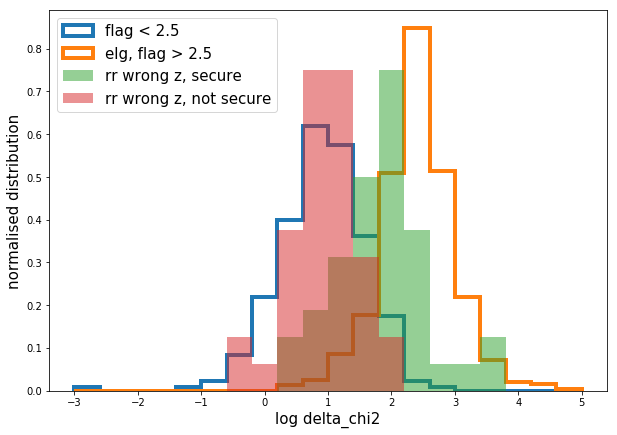

In [31]:
range=(-3,5)
plt.figure(figsize=(10,7))
plt.hist(np.log10(not_secure['DELTACHI2']), label='flag < 2.5', histtype='step', normed=True, range=range, bins=20, lw=4)
plt.hist(np.log10(good_z['DELTACHI2']), label='elg, flag > 2.5', histtype='step', normed=True, range=range, bins=20, lw=4)
plt.hist(np.log10(fail_secure['DELTACHI2']), label='rr wrong z, secure', normed=True, alpha=0.5, range=range, bins=20, lw=4)
plt.hist(np.log10(fail_not_secure['DELTACHI2']), label='rr wrong z, not secure', alpha=0.5, normed=True, range=range, bins=20, lw=4)
plt.legend(fontsize=fs)
plt.xlabel('log delta_chi2', fontsize=fs)
plt.ylabel('normalised distribution', fontsize=fs)